# Teste de Ciência de Dados - Fase de Análise - Cinnecta

## Importação de bibliotecas

In [1]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


sns.set_theme(
    style="whitegrid",
    palette="dark",
    font="Segoe UI",
    font_scale=.75,
    context="notebook",
    rc={
        "figure.figsize": (12, 8),
        "figure.dpi": 80,
        },
)

## Importação de dados

In [2]:
data = pd.read_excel('Cientista de Dados_airbnb.xlsx')

## Exploração inicial dos dados

In [3]:
# info
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7146 entries, 0 to 7145
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_is_superhost               7146 non-null   object 
 1   cancellation_policy             7146 non-null   object 
 2   instant_bookable                7146 non-null   object 
 3   host_total_listings_count       7146 non-null   float64
 4   neighbourhood_cleansed          7146 non-null   object 
 5   latitude                        7146 non-null   float64
 6   longitude                       7146 non-null   float64
 7   property_type                   7146 non-null   object 
 8   room_type                       7146 non-null   object 
 9   accommodates                    7146 non-null   float64
 10  bathrooms                       7146 non-null   object 
 11  bedrooms                        7146 non-null   float64
 12  beds                            71

In [4]:
# head
data.head()

,host_is_superhost,cancellation_policy,instant_bookable,host_total_listings_count,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,...,bedrooms_na,bathrooms_na,beds_na,review_scores_rating_na,review_scores_accuracy_na,review_scores_cleanliness_na,review_scores_checkin_na,review_scores_communication_na,review_scores_location_na,review_scores_value_na
0,t,moderate,t,1.0,Western Addition,3776931.0,-12243386.0,Apartment,Entire home/apt,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,f,strict_14_with_grace_period,f,2.0,Bernal Heights,3774511.0,-12242102.0,Apartment,Entire home/apt,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,f,strict_14_with_grace_period,f,10.0,Haight Ashbury,3776669.0,-1224525.0,Apartment,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,f,strict_14_with_grace_period,f,10.0,Haight Ashbury,3776487.0,-12245183.0,Apartment,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,f,strict_14_with_grace_period,f,2.0,Western Addition,3777525.0,-12243637.0,House,Entire home/apt,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Percepção inicial: 
- Precisarei traduzir alguns valores para algo mais usável (f->False, lat-long->cidade ou bairro etc.)
- A descrição da coluna `neighborhood_cleansed` no PDF aparenta estar errada, não se trata de limpeza do bairro, mas sim da limpeza do nome do bairro na coluna.
- Algumas colunas são específicas no contexto do Airbnb, como a `host_is_superhost` e `cancellation_policy`, e é necessário enteder melhor as implicações de cada uma delas.
- A base não aparenta ter nenhum valor nulo num primeiro olhar.
- As colunas `bedroom_na`, `bathroom_na` e `beds_na` estão zeradas nos primeiros valores. Seria uma inconsistência?

C:\Users\jefma\AppData\Local\Temp\ipykernel_17136\2250255018.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  data.hist(ax=ax)


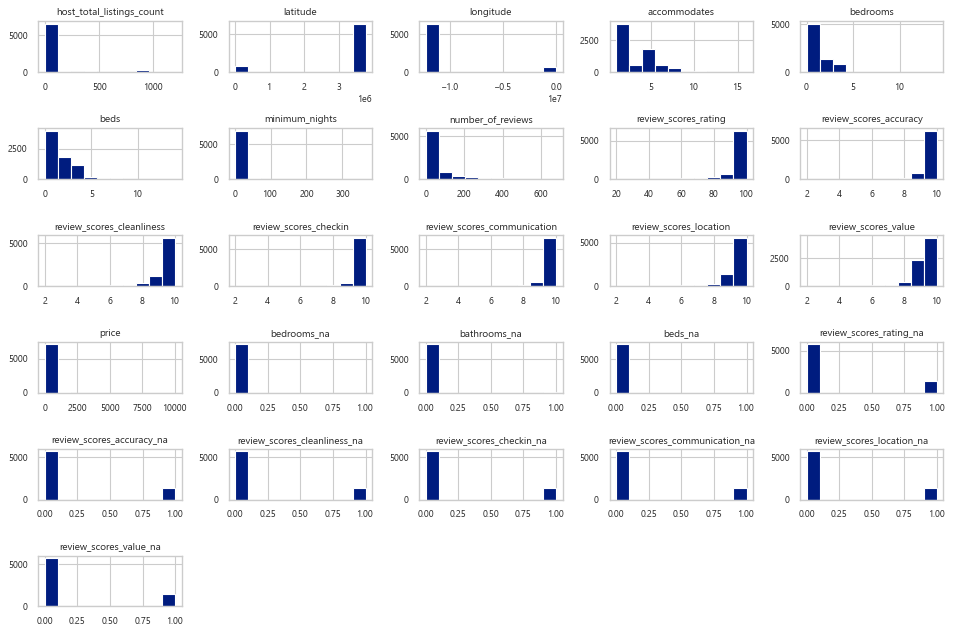

In [5]:
fig, ax = plt.subplots(figsize=(12, 8))
data.hist(ax=ax)
fig.tight_layout(w_pad=1)

Percepção inicial após olhar o histograma:
- O dicionário de dados aparenta estar invertido na descrição de alguns campos. Campos terminados em `_na` parecem ser um tipo de rate ou score enquanto que os outros campos são de fato as quantidades.
- Nenhum dado aparenta seguir uma distribuição normal -- usar métodos não-paramétricos.
- 

## Análise Campo a Campo

### host_is_superhost

Sinto a necessidade de entender o que significa ser um superhost e o que vem com isso. Segundo a [Página do Airbnb](https://www.airbnb.com.br/d/superhost):

- Superhosts possuem mais visibilidade na plataforma.
- Podem ser encontrados por mais pessoas através de filtros.
- Recebem incentivos de $100.00 por ano e bônus adicional no programa de indicação.
  
Além disso, para ser um superhost um hosto deve atender, nos últimos 12 meses, os seguintes requisitos:

- Avaliação geral >=4.8.
- Número de estadias >=10 ou Número de noites >=100 e Número de estadias >=3.
- Taxa de cancelamento <1%.
- Taxa de resposta de mensagens em 24H >=90%.
  
A captação de superhosts pode ser uma forma de alcançar o objetivo final de aumentar a rentabilidade/taxa de ocupação.

In [6]:
data.host_is_superhost.value_counts()

f    4215
t    2931
Name: host_is_superhost, dtype: int64

Irei transformar esses dados em algo mais expressivo para facilitar a análise.

In [7]:
data.host_is_superhost = data.host_is_superhost.map({'f': 'False', 't': 'True'}).astype('category')

Por fim um gráfico de barras para visualizar a distribuição dos hosts.

In [8]:
px.histogram(data, x='host_is_superhost', color='host_is_superhost', title='Host is Superhost?', text_auto=True)

In [9]:
px.pie(data, names='host_is_superhost', title='Host is Superhost?', color='host_is_superhost')

Através dessas observações, posso afirmar que uma forma de aumentar a rentabilidade/taxa de ocupação seria o aumento de superhosts, mas de forma cuidadosa. Talvez um caminho para se conseguir isso seja a criação de um modelo para classificar hosts que seriam prováveis superhosts.

### cancellation_policy

In [10]:
data.cancellation_policy.value_counts()

strict_14_with_grace_period    3086
moderate                       2518
flexible                       1424
super_strict_30                  66
strict                           43
super_strict_60                   9
Name: cancellation_policy, dtype: int64

Na [Página de ajuda do Airbnb](https://www.airbnb.com.br/help/article/475/pol%C3%ADticas-de-cancelamento-para-o-seu-an%C3%BAncio?_set_bev_on_new_domain=1652544680_ZjJmOTBmMDcyYmY5) temos as políticas de cancelamento. Para evitar repetição de texto e informação, irei apenas traduzir seus respectivos nomes aqui:

- `flexible`: Política de cancelamento flexível.
- `moderate`: Política de cancelamento moderada.
- `strict`: Política de cancelamento restrita.
- `strict_14_with_grace_period`: Política de cancelamento rigorosa.
- `super_strict_30`: Super rigorosa de 30 dias.
- `super_strict_60`: Super rigorosa de 60 dias.

Agora vamos a uma visualização:

In [11]:
px.histogram(
    data, 
    x='cancellation_policy', 
    color='cancellation_policy', 
    title='Cancellation Policy', 
    category_orders={'cancellation_policy': ['flexible', 'moderate', 'strict', 'strict_14_with_grace_period', 'super_strict_30', 'super_strict_60']},
    text_auto=True
    )

In [12]:
data.cancellation_policy.value_counts(normalize=True)

strict_14_with_grace_period    0.431850
moderate                       0.352365
flexible                       0.199272
super_strict_30                0.009236
strict                         0.006017
super_strict_60                0.001259
Name: cancellation_policy, dtype: float64

Mais hosts preferem a política de cancelamento `strict_14_with_grace_period` do que qualquer outra -- 43.18%. As outras políticas de cancelamento `strict` são as menos frequentes -- <0.1% da base. 

### instant_bookable

De acordo com a [Página do Airbnb](https://www.airbnb.com.br/help/article/523/reserva-instant%C3%A2nea?_set_bev_on_new_domain=1652544680_ZjJmOTBmMDcyYmY5) é possível reservar um quarto instantaneamente sem qualquer taxa adicional ou características atreladas.

In [13]:
data.instant_bookable.value_counts()

f    4430
t    2716
Name: instant_bookable, dtype: int64

Para este campo também transformarei os dados em algo mais expressivo antes de gerar alguma análise.

In [14]:
data.instant_bookable = data.instant_bookable.map({'f': 'False', 't': 'True'}).astype('category')

In [15]:
px.histogram(data, x='instant_bookable', color='instant_bookable', title='Instant Bookable?', text_auto=True)


In [16]:
data.instant_bookable.value_counts(normalize=True)

False    0.619927
True     0.380073
Name: instant_bookable, dtype: float64

61.99% dos apartamentos não suportam reserva instantânea.

### host_total_listings_count

Segundo o dicionário, esse é o número de vezes que o host bookou, mas 'listings' é uma palavra que se refere ao número de anúncios. Irei confiar na descrição do dicionário para esse campo.

In [17]:
data.host_total_listings_count.describe()

count    7146.000000
mean       52.604954
std       177.428653
min         0.000000
25%         1.000000
50%         2.000000
75%         8.000000
max      1199.000000
Name: host_total_listings_count, dtype: float64

In [18]:
px.histogram(data, x='host_total_listings_count', title='Host Total Bookings')

In [19]:
px.ecdf(data, x='host_total_listings_count', title='Host Total Bookings')

Analisando a ECDF dessa variável, posso dizer que menos de 0.6% dos hosts fizeram mais do que 852 reservas. 78.95% dos dados se concentram dentro do IQR. Essa é uma variável candidata a análise para aumento de ocupação e rentabilidade, visto que o número de reservas, a ocupação, tem impacto direto no lucro, além de outros fatores.

### Neighbourhood Cleansed

No dicionário de dados, a coluna `neighborhood_cleansed` é 'limpeza do bairro'. Não sei se foi uma má descrição, mas abre a porta para ambiguidade. Os dados vão dar sentido ao problema:

In [20]:
data.neighbourhood_cleansed.value_counts()

Mission                  691
Western Addition         599
South of Market          599
Downtown/Civic Center    538
Castro/Upper Market      405
Bernal Heights           373
Haight Ashbury           351
Noe Valley               317
Outer Sunset             269
Nob Hill                 215
Potrero Hill             214
Inner Richmond           186
Marina                   186
Excelsior                162
Russian Hill             159
Bayview                  157
Pacific Heights          155
Inner Sunset             154
Outer Mission            150
North Beach              149
Outer Richmond           147
Financial District       134
Parkside                 127
Chinatown                118
West of Twin Peaks       116
Ocean View               103
Glen Park                 70
Twin Peaks                63
Visitacion Valley         60
Lakeshore                 54
Crocker Amazon            52
Presidio Heights          28
Seacliff                  20
Diamond Heights           19
Golden Gate Pa

Os dados mostram nomes do que parecem ser vizinhanças ou bairros. O 'cleansed' deve se referir à limpeza dos dados. Vou remover o 'cleansed' do nome e seguir pra um gráfico.

In [21]:
data = data.rename(columns={'neighbourhood_cleansed': 'neighbourhood'})

In [22]:
px.histogram(
    data, 
    x='neighbourhood', 
    title='Neighbourhood', 
    category_orders={
        'neighbourhood': data.neighbourhood.value_counts().index.tolist()
        },
    text_auto=True
    )

C:\Users\jefma\AppData\Local\Temp\ipykernel_17136\2968816535.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



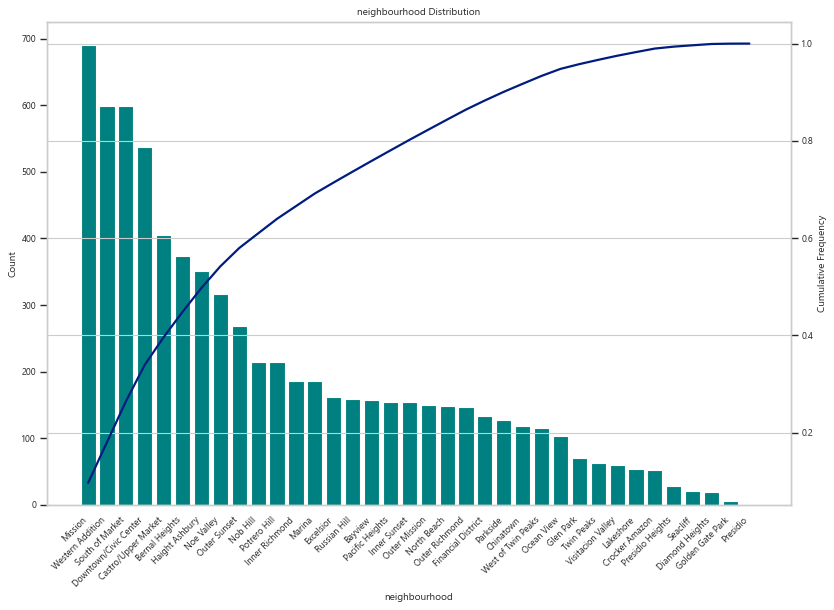

In [23]:
def cumulative_frequency_plot(data: pd.DataFrame, column: str, group_by:str=None) -> pd.DataFrame:
    """cumulative_frequency_plot
        Essa função irá gerar um gráfico de pareto para uma coluna específica
        ou para uma coluna agrupada por outra coluna.

    Args:
        data (DataFrame): DataFrame que contem os dados
        column (str): se group_by for None, column é a coluna que será plotada com uma contagem simples.
                         se group_by for definido, column é a coluna que será plotada com uma contagem agrupada pela coluna em group_by.
        group_by (str, optional): É a coluna que fará o agrupamento. Defaults to None.

    Returns:
        pd.DataFrame: Retorna a frequência cumulativa do gráfico gerado.
    """
    if group_by is not None:
        binned_data = data[column].groupby(data[group_by]).sum().sort_values(ascending=False)
    else:
        binned_data = data[column].value_counts(sort=True, ascending=False)
    relative_frequencies = binned_data / binned_data.sum()
    cumulative_frequencies = relative_frequencies.cumsum()
    fig, ax = plt.subplots(figsize=(12, 8))
    # plot binned data
    ax.bar(binned_data.index, binned_data.values, width=0.8, color='teal')
    # plot cumulative frequencies on secondary y-axis
    ax2 = ax.twinx()
    ax2.plot(
        cumulative_frequencies.index,
        cumulative_frequencies.values,
        linewidth=2,
        )
    # # format y-axis
    ax.set_ylabel('Count')
    ax.set_xlabel(column)
    ax.set_title(f'{column} Distribution')
    ax.set_xticklabels(cumulative_frequencies.index, rotation=45, ha='right')
    ax.grid(False)
    # # format secondary y-axis
    ax2.grid(True)
    ax2.set_ylabel('Cumulative Frequency')
    return cumulative_frequencies

cum_freq = cumulative_frequency_plot(data, 'neighbourhood')


C:\Users\jefma\AppData\Local\Temp\ipykernel_17136\2968816535.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



0.19444444444444445

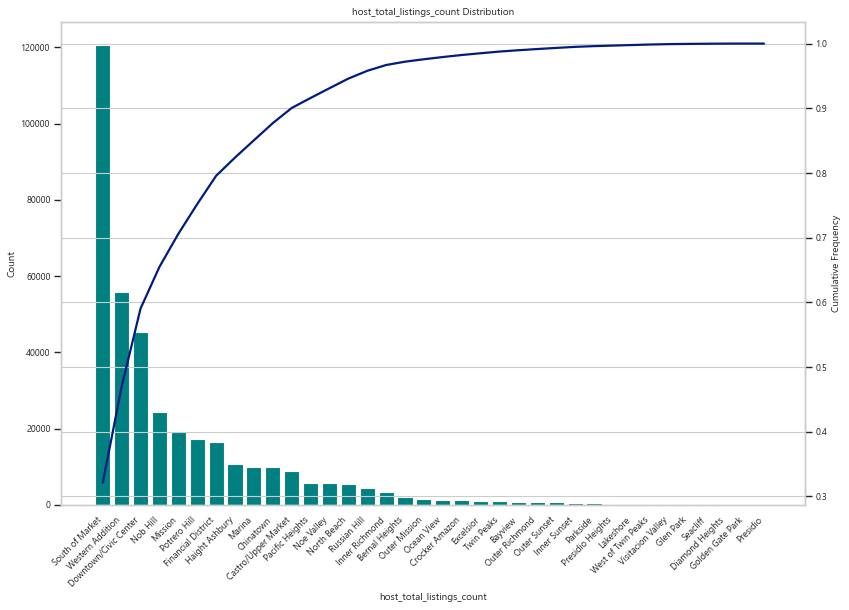

In [24]:
cum_freq = cumulative_frequency_plot(data, 'host_total_listings_count', group_by='neighbourhood')
sum(cum_freq<=0.8)/36

Não existe nada particularmente interessante nesse campo além da informação de que 17 de 36 (47%) bairros concentram ao menos 80% dos imóveis disponíveis para a locação. Ao agrupar os dados de reservas por bairro e executar o mesmo gráfico, pode-se dizer que 19.4% dos bairros são responsáveis por até 80% das reservas feitas. 

### latitude e longitude

Os bairros do atributo anterior são apenas nomes se não sei de onde vêm. Vou tentar usar o GeoPy para encontrar a cidade de cada imóvel.

In [25]:
data[['neighbourhood', 'latitude', 'longitude']].head()

,neighbourhood,latitude,longitude
0,Western Addition,3776931.0,-12243386.0
1,Bernal Heights,3774511.0,-12242102.0
2,Haight Ashbury,3776669.0,-1224525.0
3,Haight Ashbury,3776487.0,-12245183.0
4,Western Addition,3777525.0,-12243637.0


Um problema: não está em um formato aceito como latitude e longitude. Como converter?

In [26]:
def format_lat(lat):
    latitude = str(int(lat))
    latitude = f'{latitude[:2]}.{latitude[2:]}'
    return float(latitude)

def format_long(long):
    longitude = str(int(long))
    longitude = f'{longitude[:4]}.{longitude[4:]}'
    return float(longitude)

Aparentemente usar essa formatação fixa conseguiu atender o propósito.

In [27]:
data.latitude = data.latitude.map(format_lat)
data.longitude = data.longitude.map(format_long)

In [28]:
px.scatter_geo(data, lat='latitude', lon='longitude', color='neighbourhood', title='Neighbourhoods')

Todas as propriedades estão perto ou na região de San Francisco, CA. Alguns ponto estão mau localizados, mas acredito ser em função de erros na infomação. Vou descartar esses atributos por serem uma macro informação em relação ao bairro.

### property_type

In [29]:
data.property_type.value_counts()

Apartment             3010
House                 1990
Condominium            760
Guest suite            496
Boutique hotel         183
Townhouse              140
Serviced apartment     116
Hotel                  100
Loft                    93
Hostel                  87
Guesthouse              44
Bed and breakfast       29
Other                   22
Aparthotel              20
Bungalow                17
Villa                   10
Resort                   8
Cottage                  8
Tiny house               3
Cabin                    3
Boat                     2
Timeshare                1
In-law                   1
Treehouse                1
Castle                   1
Earth house              1
Name: property_type, dtype: int64

In [30]:
px.histogram(data, x='property_type', title='Property Type', color='property_type', category_orders={'property_type': data.property_type.value_counts().index.tolist()}, text_auto=True)

Neste campo não observo nenhuma inconsistência. O que pode-se concluir aqui é que a maioria dos imóveis são apartamentos, casas, fazem parte de um condomínio ou são suítes com banheiros compartilhados. Alguns casos muito pouco representativos são: casa na árvore e castelos. Apesar de serem poucos imóveis nesses casos específicos vou analisar o impacto do tipo no preço ou ocupação.

C:\Users\jefma\AppData\Local\Temp\ipykernel_17136\2968816535.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



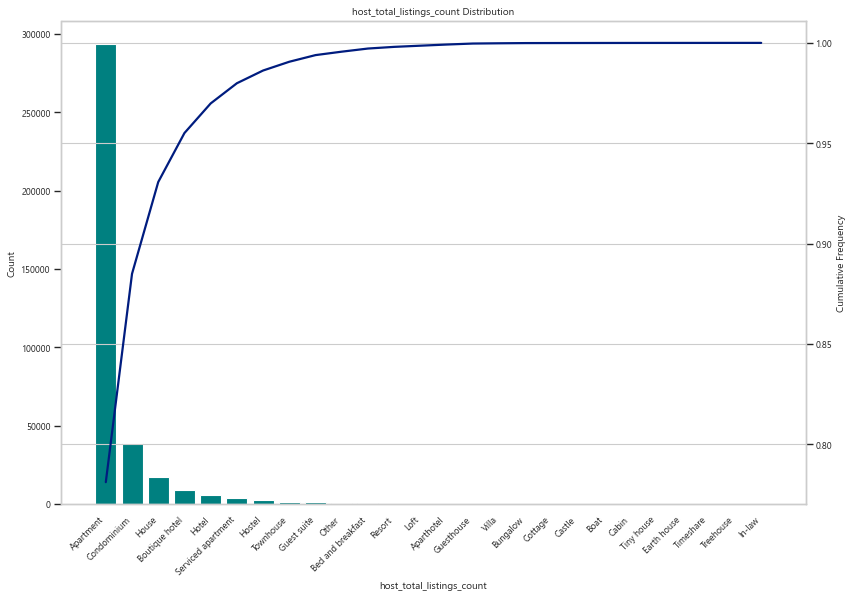

In [31]:
cum_freq = cumulative_frequency_plot(data, 'host_total_listings_count', group_by='property_type')


Aqui temos um gráfico que evidencia a concentração de reservas por imóveis do tipo apartamento. 79% das reservas são feitas em apartamentos. Condomínios e casas tem suas relevâncias invertidas, casas sendo a segunda maior quantidade de imóveis é a 3 em números de reservas realizadas. Aqui uma coisa é clara, alguns tipos de imóveis são menos atrativos para os clientes, apesar de estarem em maior quantidade. Talves isso se dê pelo preço, que será analisado posteriormente.

In [32]:
px.strip(
    data,
    x='property_type',
    y='host_total_listings_count',
    color='property_type',
    category_orders={'property_type': data.property_type.value_counts().index.tolist()},
    title='Property Type vs. Bookings',
)

### room_type

In [33]:
data.room_type.value_counts()

Entire home/apt    4364
Private room       2603
Shared room         179
Name: room_type, dtype: int64

In [34]:
px.histogram(data, x='room_type', title='Room Type', color='room_type', category_orders={'room_type': data.room_type.value_counts().index.tolist()}, text_auto=True)

Não existe muita suspresa nesse gráfico. A maioria dos imóveis são alugados de forma integral, seguido de quartos separados e alguns poucos imóveis são quartos compartilhados.

C:\Users\jefma\AppData\Local\Temp\ipykernel_17136\2968816535.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



room_type
Entire home/apt    0.920658
Private room       0.989162
Shared room        1.000000
Name: host_total_listings_count, dtype: float64

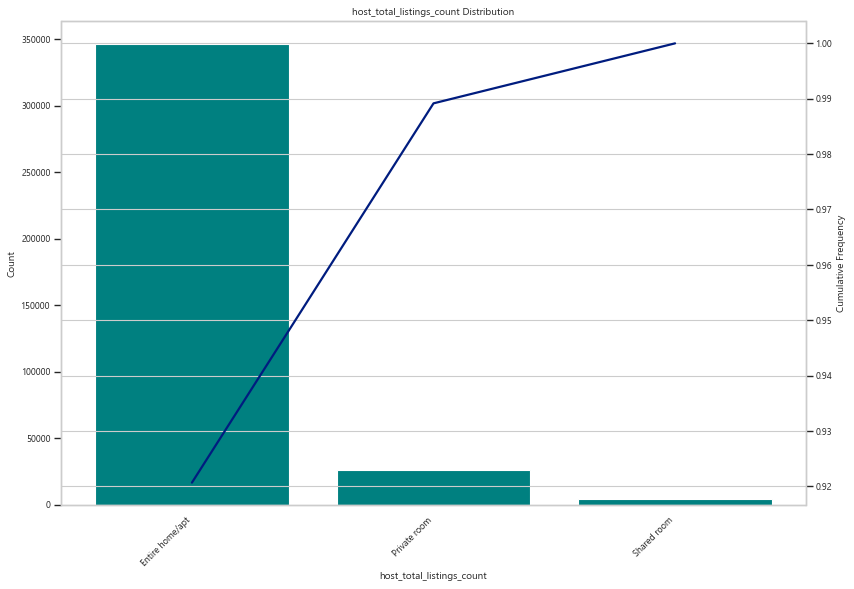

In [35]:
cumulative_frequency_plot(data, 'host_total_listings_count', group_by='room_type')

Aqui temos uma única variável sendo responsável por 92% das reservas. Os clientes que fizeram reservas em quartos compartilhados são os mais fracos, com pouco mais de 1% das reservas.

### Accomodates

In [36]:
data.accommodates.value_counts()

2.0     3208
4.0     1461
1.0      629
3.0      582
6.0      568
5.0      322
8.0      174
7.0       95
10.0      44
9.0       22
12.0      19
15.0       7
11.0       7
14.0       4
16.0       3
13.0       1
Name: accommodates, dtype: int64

In [37]:
data.accommodates.describe()

count    7146.000000
mean        3.201092
std         1.914916
min         1.000000
25%         2.000000
50%         2.000000
75%         4.000000
max        16.000000
Name: accommodates, dtype: float64

In [38]:
px.histogram(data, x='accommodates', title='Accommodates', text_auto=True)

O gráfico da quantidade de pessoas que um imóvel pode acomodar mostra que a maioria dos imóveis são de 1 a 4 pessoas.

In [39]:
fig = px.scatter(
        data,
        x='accommodates',
        y='host_total_listings_count',
        trendline='ols',
        title='Accommodates vs. Bookings',
        )
fig.show()

# print(px.get_trendline_results(fig).px_fit_results.iloc[0].summary())


Existe uma concentração de imóveis em que a quantidade de pessoas acomodadas é menor que 4. A relação disso com a quantidade de reservas é muito baixa, no entanto -- uma baixa tendência negativa.

### bathrooms

In [40]:
data.bathrooms.value_counts()

1.0                    5145
2.0                    1005
2022-05-01 00:00:00     480
2022-05-02 00:00:00     173
3.0                     132
2022-05-03 00:00:00      54
0.0                      39
4.0                      32
5.0                      26
0.5                      17
8.0                      15
10.0                     12
2022-05-04 00:00:00       8
6.0                       6
14.0                      1
2022-05-05 00:00:00       1
Name: bathrooms, dtype: int64

O atributo `bathrooms` deve ser um número. No entanto, o atributo possui algumas inconsistências: timestamps em uma quantidade significante de registros.

In [41]:
# Remove non-numeric values
data.bathrooms = pd.to_numeric(data.bathrooms, errors='coerce')
data = data.dropna(subset=['bathrooms'], axis=0)

In [42]:
data.bathrooms.value_counts()

1.0     5145
2.0     1005
3.0      132
0.0       39
4.0       32
5.0       26
0.5       17
8.0       15
10.0      12
6.0        6
14.0       1
Name: bathrooms, dtype: int64

In [43]:
px.histogram(data, x='bathrooms', title='Bathrooms')

In [44]:
px.scatter(
    data,
    x='bathrooms',
    y='host_total_listings_count',
    trendline='ols',
    title='Bathrooms vs. Bookings',
)

Não há nada muito interessante sobre essa variável. A linha de tendência é quase plana, mas não irei descartar a variável. Em conjunto com outras ela pode ser trazer alguma informação que não está a vista num primeiro momento.

### bedrooms

In [45]:
data.bedrooms.value_counts()

1.0     3905
2.0     1131
0.0      802
3.0      456
4.0      112
5.0       14
6.0        7
7.0        2
14.0       1
Name: bedrooms, dtype: int64

In [46]:
px.histogram(data, x='bedrooms', title='Bedrooms')

In [47]:
px.scatter(
    data,
    x='bedrooms',
    y='host_total_listings_count',
    trendline='ols',
    title='Bedrooms vs. Bookings',
)

Para a quantidade de quartos vemos que conforme aumenta a quantidade, menor é a quantidade de reservas feitas no imóvel. Isso talvez seja apenas uma característica dos usuários da plataforma. Talvez viajens com mais de 4 quartos sejam incomuns. Agora, existe uma quantidade considerável de imóveis com 0 quartos. Isso pode ser um problema, mas considerando a quantidade pode ser uma característica.

In [48]:
px.histogram(data[data.bedrooms == 0], x='property_type', title='0 Bedrooms', color='room_type', barmode='group')

Isso parece ser uma inconsistência, pois os imóveis com 0 quartos estão bem distribuídos pelos tipos de quarto, mas pode ser uma consideração de diferença entre suíte e quarto. De todo modo, por enquanto, não irei descartar a variável.

### beds

In [49]:
data.beds.value_counts()

1.0     3647
2.0     1664
3.0      573
4.0      308
5.0       89
0.0       80
6.0       34
7.0       20
8.0        9
10.0       3
14.0       1
11.0       1
9.0        1
Name: beds, dtype: int64

In [50]:
px.histogram(data, x='beds', title='Beds')

Novamente, alguns casos em que não se tem cama. 

In [51]:
px.scatter(
    data,
    x='beds',
    y='host_total_listings_count',
    trendline='ols',
    title='Beds vs. Bookings',
)

Aqui existe, também, alguma correlação ou tendência entre o número de camas e o total de reservas.

### bed_type

In [52]:
data.bed_type.value_counts()

Real Bed         6367
Futon              28
Pull-out Sofa      18
Airbed             11
Couch               6
Name: bed_type, dtype: int64

In [53]:
px.histogram(data, x='bed_type', title='Bed Type', category_orders={'bed_type': data.bed_type.value_counts().index.tolist()}, text_auto=True)

Existem aqui algumas distinções entre camas e outros tipos de móveis para descanso. Vou verificar se os casos em que não se tem cama estão inclusos aqui.

In [54]:
px.histogram(data[data.beds == 0], x='bed_type',
             title='0 Beds',)


Muito provavelmente se trata de uma inconsistência nos dados. Não irei tratar ainda, mas no momento, considero substituição pela mediana.

### minimum_nights

In [55]:
data.minimum_nights.value_counts()

30.0     2539
2.0      1298
1.0      1155
3.0       705
4.0       223
5.0       149
31.0      115
7.0        58
32.0       29
60.0       29
180.0      27
6.0        27
90.0       27
45.0        7
365.0       5
120.0       4
14.0        4
28.0        2
40.0        2
80.0        2
10.0        2
85.0        1
21.0        1
35.0        1
8.0         1
18.0        1
100.0       1
9.0         1
188.0       1
58.0        1
360.0       1
13.0        1
140.0       1
25.0        1
170.0       1
70.0        1
59.0        1
29.0        1
200.0       1
183.0       1
50.0        1
24.0        1
Name: minimum_nights, dtype: int64

In [56]:
px.histogram(data, x='minimum_nights', title='Minimum Nights', marginal='box')

In [57]:
px.scatter(
    data,
    x='minimum_nights',
    y='host_total_listings_count',
    title='Minimum Nights vs. Bookings',
    trendline='ols',
)

In [58]:
px.ecdf(
    data,
    x='minimum_nights',
    title='Minimum Nights',
)


Com esse gráfico observa-se uma tendencia positiva com o número mínimo de noites. Seria o número de vezes que o imóvel foi reservado um total de noites para o qual foi reservado? Suponho que não há redundância de informação e, portanto, irei remover os imóveis que tenham mais de 90 dias míniimos de reserva, que representam >1% dos imóveis.

In [59]:
data = data.loc[data.minimum_nights <= 90, :]

### number_of_reviews

In [60]:
data.number_of_reviews.value_counts()

0.0      1257
1.0       473
2.0       311
3.0       202
4.0       171
         ... 
344.0       1
404.0       1
388.0       1
286.0       1
253.0       1
Name: number_of_reviews, Length: 366, dtype: int64

In [61]:
data.number_of_reviews.describe()

count    6387.000000
mean       44.628464
std        74.080402
min         0.000000
25%         1.000000
50%        12.000000
75%        56.000000
max       677.000000
Name: number_of_reviews, dtype: float64

In [62]:
px.scatter(
    data,
    x='number_of_reviews',
    y='host_total_listings_count',
    title='Number of Reviews vs. Bookings',
    trendline='ols',
    marginal_x='box'
)

Como imóveis com tantas reservas tem tão poucos reviews e aqueles com muitos reviews tem poucas reservas? Segundo a [Página de ajuda do Airbnb](https://www.airbnb.com.br/help/article/13/avalia%C3%A7%C3%B5es-de-acomoda%C3%A7%C3%B5es?_set_bev_on_new_domain=1652544680_ZjJmOTBmMDcyYmY5) sobre escrita de reviews: só podem ser escritas até 14 dias após o checkout. Ou seja: um imóvel vai ter de reviews, no máximo, o número de reservas feitas. Porém, observa-se que o número de reviews é maior que o número de reservas em muitos pontos. Uma possível explicação para isso seria que os dados de reserva são referentes a algum período de 1 ano, por exemplo, mas os reviews são o total de reviews feitos ao longo do tempo daquele imóvel na plataforma.

Decido então ignorar essa variável de reviews e seguir a análise sem ela.

### review_scores_rating

In [63]:
data.review_scores_rating.describe().to_frame()

,review_scores_rating
count,6387.000000
mean,95.956631
std,6.404628
min,20.000000
25%,95.000000
50%,98.000000
75%,99.000000
max,100.000000


In [64]:
px.scatter(data, x='review_scores_rating', y='host_total_listings_count', title='Review Scores Rating vs. Bookings', trendline='ols', marginal_x='box')

### reviews_scores_accuracy

In [65]:
data.review_scores_accuracy.describe().to_frame()

,review_scores_accuracy
count,6387.000000
mean,9.819947
std,0.606487
min,2.000000
25%,10.000000
50%,10.000000
75%,10.000000
max,10.000000


In [66]:
px.scatter(data, x='review_scores_accuracy', y='host_total_listings_count', title='Review Scores Accuracy vs. Bookings', marginal_x='histogram', trendline='ols')

### review_scores_cleanliness

In [67]:
data.review_scores_cleanliness.value_counts().to_frame()

,review_scores_cleanliness
10.0,5030
9.0,1014
8.0,241
7.0,56
6.0,30
4.0,10
2.0,4
3.0,1
5.0,1


In [68]:
data.review_scores_cleanliness.describe().to_frame()

,review_scores_cleanliness
count,6387.000000
mean,9.704400
std,0.696048
min,2.000000
25%,10.000000
50%,10.000000
75%,10.000000
max,10.000000


In [69]:
px.scatter(data, x='review_scores_cleanliness', y='host_total_listings_count', title='Review Scores Cleanliness vs. Bookings', trendline='ols', marginal_x='histogram')

### review_scores_checkin

In [70]:
data.review_scores_checkin.value_counts().to_frame()

,review_scores_checkin
10.0,5904
9.0,381
8.0,66
7.0,18
6.0,12
2.0,5
4.0,1


In [71]:
data.review_scores_checkin.describe().to_frame()

,review_scores_checkin
count,6387.000000
mean,9.896509
std,0.448855
min,2.000000
25%,10.000000
50%,10.000000
75%,10.000000
max,10.000000


In [72]:
px.scatter(data, x='review_scores_checkin', y='host_total_listings_count', title='Review Scores Checkin vs. Bookings', trendline='ols', marginal_x='histogram')

### review_scores_communication

In [73]:
data.review_scores_communication.value_counts().to_frame()

,review_scores_communication
10.0,5811
9.0,457
8.0,72
7.0,17
6.0,17
2.0,8
4.0,5


In [74]:
data.review_scores_communication.value_counts().to_frame()

,review_scores_communication
10.0,5811
9.0,457
8.0,72
7.0,17
6.0,17
2.0,8
4.0,5


In [75]:
px.scatter(data, x='review_scores_communication', y='host_total_listings_count', title='Review Scores communication vs. Bookings', trendline='ols', marginal_x='histogram')

### review_scores_location

In [76]:
data.review_scores_location.value_counts().to_frame()

,review_scores_location
10.0,4970
9.0,1178
8.0,159
7.0,33
6.0,28
4.0,11
2.0,6
3.0,1
5.0,1


In [77]:
data.review_scores_location.value_counts().to_frame()

,review_scores_location
10.0,4970
9.0,1178
8.0,159
7.0,33
6.0,28
4.0,11
2.0,6
3.0,1
5.0,1


In [78]:
px.scatter(data, x='review_scores_location', y='host_total_listings_count', title='Review Scores location vs. Bookings', trendline='ols', marginal_x='histogram')

### review_scores_value

In [79]:
data.review_scores_value.value_counts().to_frame()

,review_scores_value
10.0,3955
9.0,2043
8.0,287
7.0,41
6.0,41
4.0,9
2.0,7
5.0,4


In [80]:
data.review_scores_value.value_counts().to_frame()

,review_scores_value
10.0,3955
9.0,2043
8.0,287
7.0,41
6.0,41
4.0,9
2.0,7
5.0,4


In [81]:
px.scatter(data, x='review_scores_value', y='host_total_listings_count', title='Review Scores Value vs. Bookings', trendline='ols', marginal_x='histogram')

### price

In [82]:
data.price.describe().to_frame()

,price
count,6387.000000
mean,199.270080
std,285.040894
min,10.000000
25%,100.000000
50%,150.000000
75%,225.000000
max,10000.000000


In [83]:
data.price.describe().to_frame()

,price
count,6387.000000
mean,199.270080
std,285.040894
min,10.000000
25%,100.000000
50%,150.000000
75%,225.000000
max,10000.000000


In [84]:
px.histogram(data, x='price', title='Price')

In [85]:
px.scatter(data, x='price', y='host_total_listings_count', title='Price vs. Bookings', trendline='ols')

Observa-se que existe uma correlação negativa entre os preços e a quantidade de reservas. Faz sentido que os preços mais altos sejam menos reservados, mas para afirmar isso seria necessário avaliar o perfil dos usuários.

### review_scores_rating_na

As colunas de dado abaixo julgo serem irrelevantes para a análise por serem muito parecidos e não possuírem uma explicação muito precisa.

In [86]:
data.review_scores_rating_na.value_counts().to_frame()

,review_scores_rating_na
0.0,5094
1.0,1293


In [87]:
data.review_scores_rating_na.value_counts().to_frame()

,review_scores_rating_na
0.0,5094
1.0,1293


In [88]:
px.histogram(data, x='review_scores_rating_na', title='Review Scores Rating NA')

### review_scores_accuracy_na

In [89]:
data.review_scores_accuracy_na.value_counts().to_frame()

,review_scores_accuracy_na
0.0,5090
1.0,1297


In [90]:
data.review_scores_accuracy_na.describe().to_frame()

,review_scores_accuracy_na
count,6387.000000
mean,0.203069
std,0.402315
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


### review_scores_cleanliness_na

In [91]:
data.review_scores_cleanliness_na.value_counts().to_frame()

,review_scores_cleanliness_na
0.0,5091
1.0,1296


### review_scores_checkin_na

In [92]:
data.review_scores_checkin_na.value_counts().to_frame()

,review_scores_checkin_na
0.0,5089
1.0,1298


### review_scores_communication_na

In [93]:
data.review_scores_communication_na.value_counts().to_frame()

,review_scores_communication_na
0.0,5092
1.0,1295


### review_scores_location_na

In [94]:
data.review_scores_location_na.value_counts().to_frame()

,review_scores_location_na
0.0,5089
1.0,1298


### review_scores_value_na

In [95]:
data.review_scores_value_na.value_counts().to_frame()

,review_scores_value_na
0.0,5088
1.0,1299


### Analisar relacionamento entre variáveis

Antes de avaliar a correlação entre as variáveis, irei remover os campos que considero irrelevantes.

In [96]:
# Remover campos que não são relevantes
data = data.drop(
    [
        'latitude',
        'longitude',
        'bedrooms_na',
        'bathrooms_na',
        'beds_na',
        'review_scores_rating_na',
        'review_scores_accuracy_na',
        'review_scores_cleanliness_na',
        'review_scores_checkin_na',
        'review_scores_communication_na',
        'review_scores_location_na',
        'review_scores_value_na',
        'number_of_reviews',
    ],
    axis=1,
    )

Após isso calculo a correlação de spearman entre as variáveis.

In [97]:
corr = data.corr(method='spearman').iloc[:, 0]
corr

host_total_listings_count      1.000000
accommodates                  -0.111030
bathrooms                      0.007367
bedrooms                      -0.216409
beds                          -0.101913
minimum_nights                 0.169708
review_scores_rating          -0.073085
review_scores_accuracy        -0.107136
review_scores_cleanliness     -0.076275
review_scores_checkin         -0.085612
review_scores_communication   -0.114661
review_scores_location         0.030471
review_scores_value           -0.002405
price                         -0.133370
Name: host_total_listings_count, dtype: float64

## Salvar arquivo "filtrado"

Após o vislumbre da correlação, irei salvar os resultados em um arquivo `.csv` com os dados filtrados.

In [98]:
data.to_csv('airbnb_filtrado.csv', index=False)